In [26]:
import pandas as pd
import numpy as np
import wget
from tqdm import tqdm
import cv2 
import matplotlib.pyplot as plt
from PIL import Image
import glob 
import json
import pickle

import tensorflow as tf

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

## Loading Data

In [2]:
df = pd.read_csv("Milkweed_iNaturalist.csv")
df.head()

,id,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,user_name,created_at,updated_at,...,geoprivacy,taxon_geoprivacy,coordinates_obscured,positioning_method,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id
0,101943,Sun Jul 15 2012 14:33:04 GMT-0500 (CDT),7/15/2012,2012-07-15 19:33:04 UTC,Central Time (US & Canada),6113,montanamike,NaN,2012-07-16 01:41:15 UTC,2017-05-13 02:16:27 UTC,...,NaN,NaN,False,NaN,NaN,common milkweed,Asclepias syriaca,common milkweed,Plantae,47911
1,160843,12/11/2012,12/11/2012,NaN,Central Time (US & Canada),8882,bouteloua,cassi saari,2012-12-12 02:52:15 UTC,2018-03-11 20:16:29 UTC,...,NaN,NaN,False,NaN,NaN,common milkweed,Asclepias syriaca,common milkweed,Plantae,47911
2,311680,"June 25, 2013 10:49:00 AM CDT",6/25/2013,2013-06-25 15:49:00 UTC,Central Time (US & Canada),18260,mergirl22,NaN,2013-06-25 19:54:12 UTC,2017-05-13 02:26:32 UTC,...,NaN,NaN,False,gps,gps,common milkweed,Asclepias syriaca,common milkweed,Plantae,47911
3,375506,Wed Aug 21 2013 10:31:33 GMT-0500 (CDT),8/21/2013,2013-08-21 15:31:33 UTC,Central Time (US & Canada),19192,eplonka1,NaN,2013-08-24 15:22:46 UTC,2017-05-13 03:31:51 UTC,...,NaN,NaN,False,NaN,NaN,common milkweed,Asclepias syriaca,common milkweed,Plantae,47911
4,393770,9/5/2013 14:32,9/5/2013,2013-09-05 21:32:03 UTC,Pacific Time (US & Canada),2991,sea-kangaroo,NaN,2013-09-10 21:12:19 UTC,2023-03-05 17:34:49 UTC,...,NaN,NaN,False,NaN,manual,Broadleaf Milkweed,Asclepias syriaca,common milkweed,Plantae,47911


In [6]:
df.columns

Index(['id', 'observed_on_string', 'observed_on', 'time_observed_at',
       'time_zone', 'user_id', 'user_login', 'user_name', 'created_at',
       'updated_at', 'quality_grade', 'license', 'url', 'image_url',
       'sound_url', 'tag_list', 'description', 'num_identification_agreements',
       'num_identification_disagreements', 'captive_cultivated',
       'oauth_application_id', 'place_guess', 'latitude', 'longitude',
       'positional_accuracy', 'private_place_guess', 'private_latitude',
       'private_longitude', 'public_positional_accuracy', 'geoprivacy',
       'taxon_geoprivacy', 'coordinates_obscured', 'positioning_method',
       'positioning_device', 'species_guess', 'scientific_name', 'common_name',
       'iconic_taxon_name', 'taxon_id'],
      dtype='object')

In [ ]:
# with open("resources/image_name_to_url.json", "r") as outfile:
#     d = json.load(outfile)

# with open('image_name_to_vector.pickle', 'rb') as handle:
#     d = pickle.load(handle)

# with open('initial_clustering.pickle', 'rb') as handle:
#     labels = pickle.load(handle)

# with open('resources/location_clustering.pickle', 'rb') as handle:
#     labels_coordinates = pickle.load(handle)

## Downloading Milkweed Images

In [7]:
# d = dict()
# for link in tqdm(range(len(df['image_url']))):
#     try:
#         wget.download(df['image_url'][link], out='milkweed/images/'+str(link)+'.jpg')
#         d[df['image_url'][link]] = []
#         d[df['image_url'][link]].append(str(link))
#     except:
#         continue

In [8]:
# with open("image_name_to_url.json", "w") as outfile:
#     json.dump(d, outfile)

## Clustering Images based on Visual Properties

In [4]:
model = tf.keras.models.load_model("resources/leaf_area_segmented.h5")

x = model.layers[-2].output
model_top = tf.keras.Model(inputs = model.input, outputs = x)

2023-05-18 17:32:18.877047: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-18 17:32:19.554833: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-18 17:32:19.554991: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-05-18 17:32:19.555745: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorF

#### Generating Latent Vectors for each image

In [7]:
latent_vectors = []
for key in d.keys():

    image = d[key][0]
    img = cv2.imread("milkweed/images/"+str(image) + ".jpg")
    img = cv2.resize(img, (224,224))
    img = np.expand_dims(img, axis=0)
    output = model_top.predict(img)
    latent_vectors.append(output)
    d[key].append(output)


2023-05-18 17:33:16.531161: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8901


1/1 [==============================] - 0s 17ms/step


In [14]:
# with open('image_name_to_vector.pickle', 'wb') as handle:
#     pickle.dump(d, handle)

## Dimensionality Reduction and Clustering

In [8]:
latent_vectors = np.array(latent_vectors).reshape(-1,2048)

pca = PCA(n_components=100, random_state=22)
pca.fit(latent_vectors)
modified_vectors = pca.transform(latent_vectors)

In [9]:
modified_vectors.shape

(4210, 100)

In [10]:
kmeans = KMeans(n_clusters=100, random_state=22)
kmeans.fit(modified_vectors)

labels = kmeans.labels_

/home/sac0380/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [60]:
# with open('initial_clustering.pickle', 'wb') as handle:
#     pickle.dump(labels, handle)

/tmp/ipykernel_279765/2103262184.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  for idx in list(np.array(list(d.values()))[:, 0]):


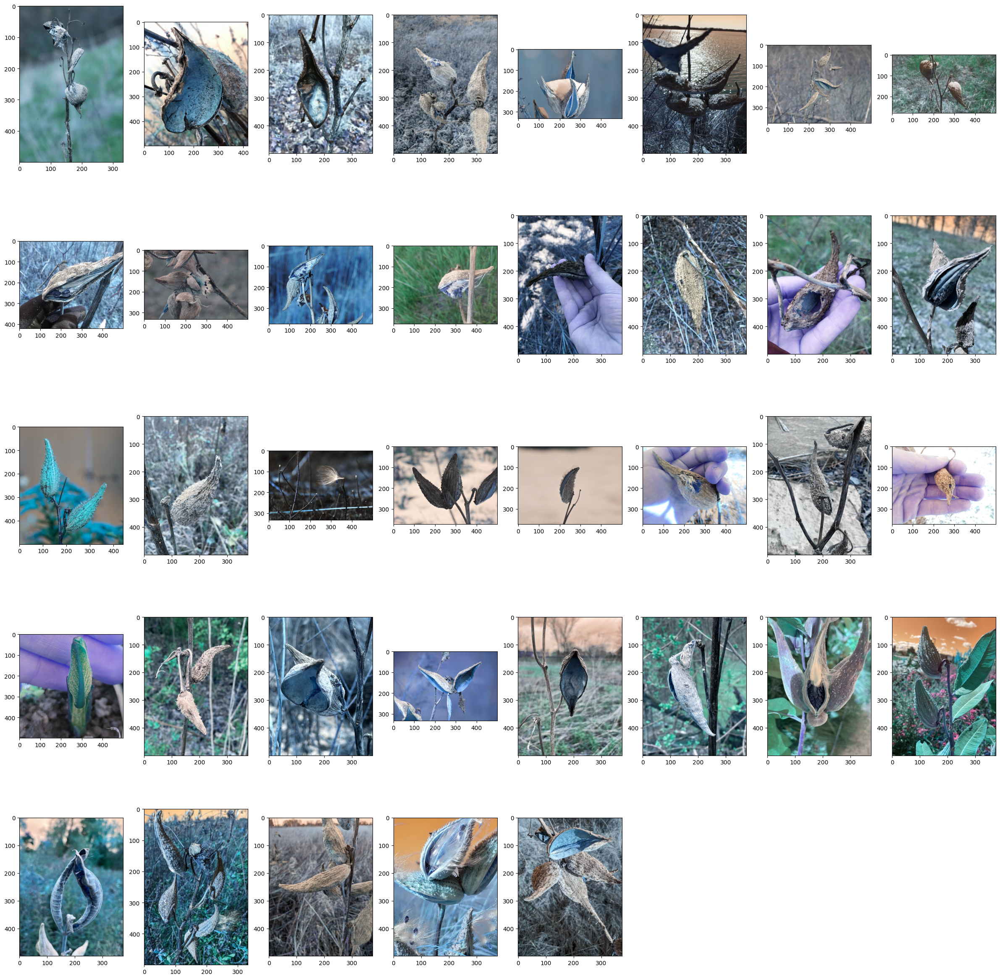

In [13]:
fig = plt.figure(1, figsize=(30, 30))
i = 0
for idx in list(np.array(list(d.values()))[:, 0]):
    if labels[int(idx)] == 2:
        img = cv2.imread("milkweed/images/" + str(idx) + ".jpg")
        ax = fig.add_subplot(5,8,i+1)
        ax.imshow(img)  
        i+=1

plt.show()

In [14]:
coordinates = np.array([[df.loc[df['image_url'] == i, 'latitude'][int(d[i][0])], df.loc[df['image_url'] == i, 'longitude'][int(d[i][0])]] for i in d.keys()])
#combined_vectors = np.array([list(modified_vectors[i]) + list(coordinates[i]) for i in range(len(list(d.keys())))])
coordinates.shape

(4210, 2)

In [15]:
kmeans_location = KMeans(n_clusters=50, init='k-means++', random_state=22)
kmeans_location.fit(coordinates)
labels_coordinates = kmeans_location.labels_

/home/sac0380/miniconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [28]:
# with open('resources/location_clustering.pickle', 'wb') as handle:
#     pickle.dump(labels_coordinates, handle)

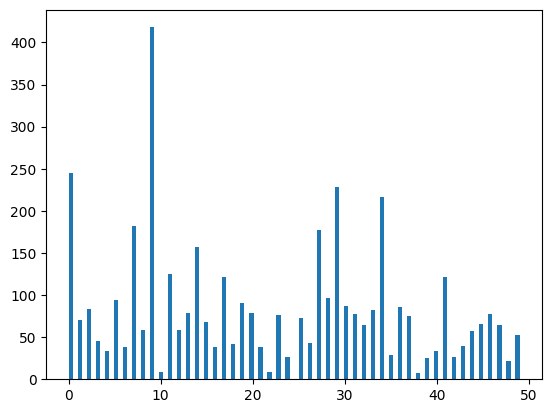

In [17]:
plt.hist(kmeans_location.labels_, bins=100)
plt.show()

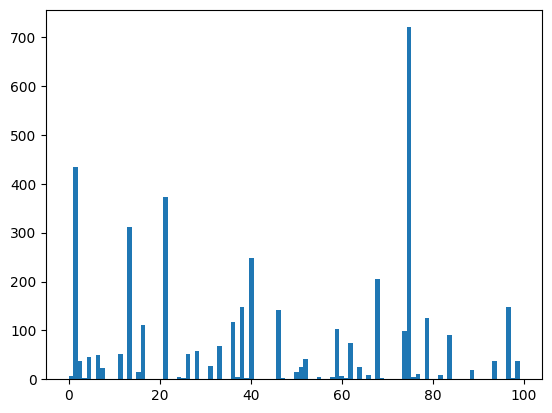

In [18]:
plt.hist(labels, bins=100)
plt.show()

### Elbow Method

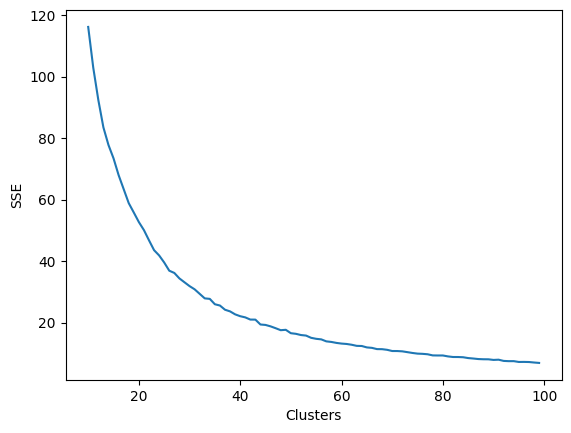

In [135]:
#elbow method
wcss = []
for i in range(10,100):
    k_means = KMeans(n_clusters=i,init='k-means++', random_state=42)
    k_means.fit(coordinates)
    wcss.append(k_means.inertia_)
#plot elbow curve
plt.plot(np.arange(10,100),wcss)
plt.xlabel('Clusters')
plt.ylabel('SSE')
plt.show()

/tmp/ipykernel_279765/2108792938.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  for idx in list(np.array(list(d.values()))[:, 0]):


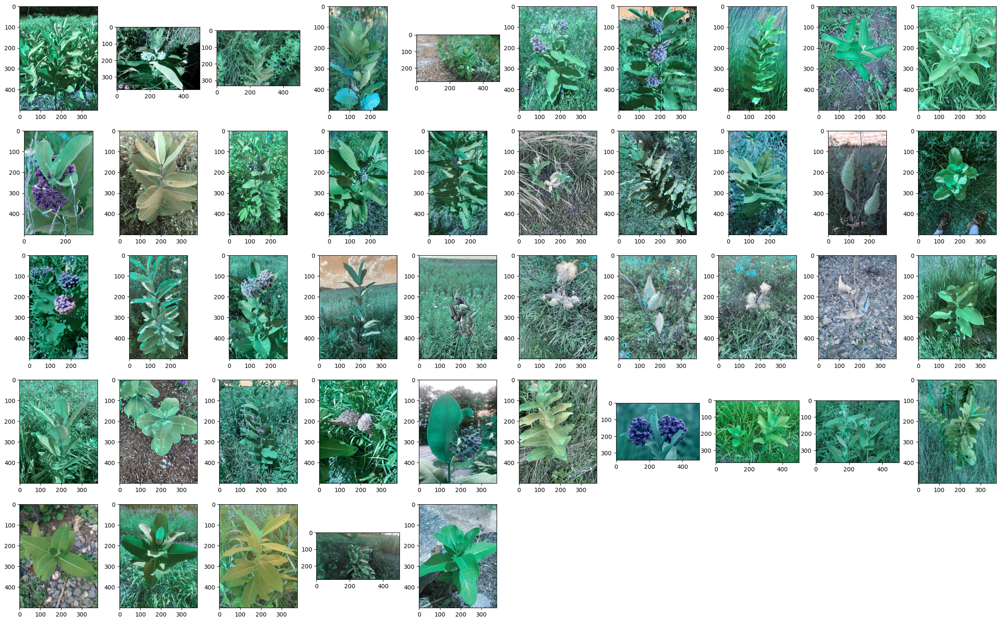

In [24]:
fig = plt.figure(1, figsize=(30, 30))
i = 0
for idx in list(np.array(list(d.values()))[:, 0]):
    if labels_coordinates[int(idx)] == 3:
        img = cv2.imread("milkweed/images/" + str(idx) + ".jpg")
        ax = fig.add_subplot(8,10,i+1)
        ax.imshow(img)  
        i+=1

plt.show()

## Cluster Similarity

In [20]:
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
from sklearn.feature_selection import mutual_info_classif

mutual_info_classif(labels.reshape(-1, 1), labels_coordinates.reshape(-1, 1), n_neighbors=3)
adjusted_mutual_info_score(labels, labels_coordinates)

/home/sac0380/miniconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1141: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0.017504610110799478

In [31]:
adjusted_rand_score(labels, labels_coordinates)

0.003987999492205751

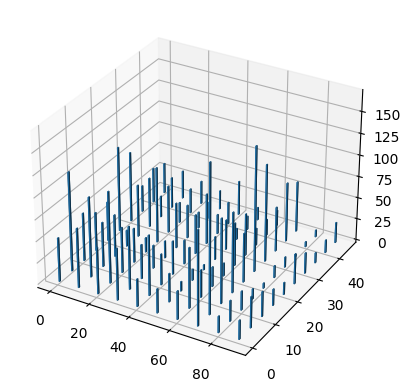

In [21]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

hs_im, xe, ye = np.histogram2d(labels, labels_coordinates)

xpos, ypos = np.meshgrid(xe[:-1] + 0.25, ye[:-1] + 0.25, indexing="ij")
xpos = xpos.ravel()
ypos = ypos.ravel()

dx = dy = 0.5 * np.ones_like(0)

ax.bar3d(xpos, ypos, 0, dx, dy, hs_im.ravel(), zsort='average')

plt.show()

## Generating Output CSV File

In [33]:
output_df = df.copy()
output_df['Visual_Cluster'] = labels
output_df['location_Cluster'] = labels_coordinates
output_df.head()

,id,observed_on_string,observed_on,time_observed_at,time_zone,user_id,user_login,user_name,created_at,updated_at,...,coordinates_obscured,positioning_method,positioning_device,species_guess,scientific_name,common_name,iconic_taxon_name,taxon_id,Visual_Cluster,location_Cluster
0,101943,Sun Jul 15 2012 14:33:04 GMT-0500 (CDT),7/15/2012,2012-07-15 19:33:04 UTC,Central Time (US & Canada),6113,montanamike,NaN,2012-07-16 01:41:15 UTC,2017-05-13 02:16:27 UTC,...,False,NaN,NaN,common milkweed,Asclepias syriaca,common milkweed,Plantae,47911,1,40
1,160843,12/11/2012,12/11/2012,NaN,Central Time (US & Canada),8882,bouteloua,cassi saari,2012-12-12 02:52:15 UTC,2018-03-11 20:16:29 UTC,...,False,NaN,NaN,common milkweed,Asclepias syriaca,common milkweed,Plantae,47911,24,12
2,311680,"June 25, 2013 10:49:00 AM CDT",6/25/2013,2013-06-25 15:49:00 UTC,Central Time (US & Canada),18260,mergirl22,NaN,2013-06-25 19:54:12 UTC,2017-05-13 02:26:32 UTC,...,False,gps,gps,common milkweed,Asclepias syriaca,common milkweed,Plantae,47911,36,42
3,375506,Wed Aug 21 2013 10:31:33 GMT-0500 (CDT),8/21/2013,2013-08-21 15:31:33 UTC,Central Time (US & Canada),19192,eplonka1,NaN,2013-08-24 15:22:46 UTC,2017-05-13 03:31:51 UTC,...,False,NaN,NaN,common milkweed,Asclepias syriaca,common milkweed,Plantae,47911,26,19
4,393770,9/5/2013 14:32,9/5/2013,2013-09-05 21:32:03 UTC,Pacific Time (US & Canada),2991,sea-kangaroo,NaN,2013-09-10 21:12:19 UTC,2023-03-05 17:34:49 UTC,...,False,NaN,manual,Broadleaf Milkweed,Asclepias syriaca,common milkweed,Plantae,47911,21,46


In [34]:
output_df.to_csv('resources/output.csv')